# 7. Harris Edge & Corner Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Color image to Grayscale conversion](#grayscale)
3. [Spatial derivative calculation](#spatial)
4. [Structure tensor setup](#tensor)
5. [Harris response calculation](#response)
6. [Find edges and corners using R](#find)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
import cv2
import matplotlib.pyplot as plt
from scipy import signal as sig
import numpy as np
from scipy.ndimage.filters import convolve
import os

## 1. Color to Grayscale <a class="anchor" id="grayscale" ></a>

In [ ]:
img = cv2.imread('data/chessboard.jpg')
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

## 2. Spatial derivative calculation <a class="anchor" id="spatial" ></a>

In [ ]:
def gradient_x(imggray):
    ##Sobel operator kernels.
    kernel_x = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    return sig.convolve2d(imggray, kernel_x, mode='same')

def gradient_y(imggray):
    kernel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])
    return sig.convolve2d(imggray, kernel_y, mode='same')

I_x = gradient_x(img_gray)
I_y = gradient_y(img_gray)

## 3. Structure tensor setup <a class="anchor" id="tensor" ></a>

In [ ]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g


Ixx = convolve(I_x**2, gaussian_kernel(3, 1))
Ixy = convolve(I_y*I_x, gaussian_kernel(3, 1))
Iyy = convolve(I_y**2, gaussian_kernel(3, 1))

## 4. Harris response calculation <a class="anchor" id="response" ></a>

In [ ]:
k = 0.05

# determinant
detA = Ixx * Iyy - Ixy ** 2

# trace
traceA = Ixx + Iyy
    
harris_response = detA - k * traceA ** 2

In [ ]:
img_gray.shape

In [ ]:
window_size = 3
offset = window_size//2
width, height = img_gray.shape

for y in range(offset, height-offset):
    for x in range(offset, width-offset):
        Sxx = np.sum(Ixx[y-offset:y+1+offset, x-offset:x+1+offset])
        Syy = np.sum(Iyy[y-offset:y+1+offset, x-offset:x+1+offset])
        Sxy = np.sum(Ixy[y-offset:y+1+offset, x-offset:x+1+offset])

In [ ]:
#Find determinant and trace, use to get corner response
det = (Sxx * Syy) - (Sxy**2)
trace = Sxx + Syy
r = det - k*(trace**2)

## 5. Find edges and corners using R <a class="anchor" id="find" ></a>

In [ ]:
img_copy_for_corners = np.copy(img)
img_copy_for_edges = np.copy(img)

for rowindex, response in enumerate(harris_response):
    for colindex, r in enumerate(response):
        if r > 0:
            # this is a corner
            img_copy_for_corners[rowindex, colindex] = [255,0,0]
        elif r < 0:
            # this is an edge
            img_copy_for_edges[rowindex, colindex] = [0,255,0]

In [ ]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_copy_for_corners, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_copy_for_edges, cmap="gray")

## Homework <a class="anchor" id="homework" ></a>

### a) In the Harris Detector Collab, it is suggested that tests be carried out with their own images that the team decides to use. The idea is to choose an object and take photos with different types of lighting (under the sun, in a dark place) and under different angles to analyze the behavior of the Harris detector under different settings.

In [76]:
IMAGE_PATH = "data/homework/harris"

In [77]:
def apply_harris_detection(img, k = 0.05):
    # Spacial derivative calculation:
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    I_x = gradient_x(img_gray)
    I_y = gradient_y(img_gray)

    # Setup tensor structure:
    Ixx = convolve(I_x**2, gaussian_kernel(3, 1))
    Ixy = convolve(I_y*I_x, gaussian_kernel(3, 1))
    Iyy = convolve(I_y**2, gaussian_kernel(3, 1))

    # Harris response calculation:
    detA = Ixx * Iyy - Ixy ** 2
    traceA = Ixx + Iyy
    harris_response = detA - k * traceA ** 2

    window_size = 3
    offset = window_size//2
    width, height = img_gray.shape

    for y in range(offset, height-offset):
        for x in range(offset, width-offset):
            Sxx = np.sum(Ixx[y-offset:y+1+offset, x-offset:x+1+offset])
            Syy = np.sum(Iyy[y-offset:y+1+offset, x-offset:x+1+offset])
            Sxy = np.sum(Ixy[y-offset:y+1+offset, x-offset:x+1+offset])

    # Find determinant and trace, use to get corner response:
    det = (Sxx * Syy) - (Sxy**2)
    trace = Sxx + Syy
    r = det - k*(trace**2)

    # Find edges and corners
    img_copy_for_corners = np.copy(img)
    img_copy_for_edges = np.copy(img)

    for rowindex, response in enumerate(harris_response):
        for colindex, r in enumerate(response):
            if r > 0:
                # this is a corner
                img_copy_for_corners[rowindex, colindex] = [255,0,0]
            elif r < 0:
                # this is an edge
                img_copy_for_edges[rowindex, colindex] = [0,255,0]

    return img_copy_for_corners, img_copy_for_edges


In [78]:
def display_images(img, img_secondary):
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap="gray")
    plt.subplot(1, 2, 2)
    plt.imshow(img_secondary, cmap="gray")

We'll use a cat figure in a donut in different settings to test the Harris algorithm:

a.1) Figure under direct sunlight

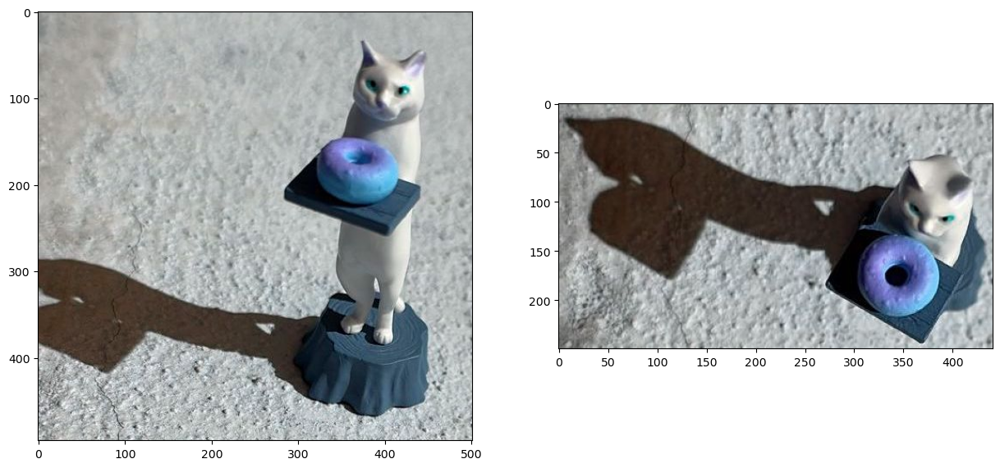

In [79]:
img = cv2.imread(os.path.join(IMAGE_PATH, 'sunlight.jpeg'))
img_top = cv2.imread(os.path.join(IMAGE_PATH, 'sunlight_top.jpeg'))

display_images(img, img_top)

In [80]:
img_harris_corner, img_harris_edges = apply_harris_detection(img)
img_harris_corner_top, img_harris_edges_top = apply_harris_detection(img_top)

Corner detection:


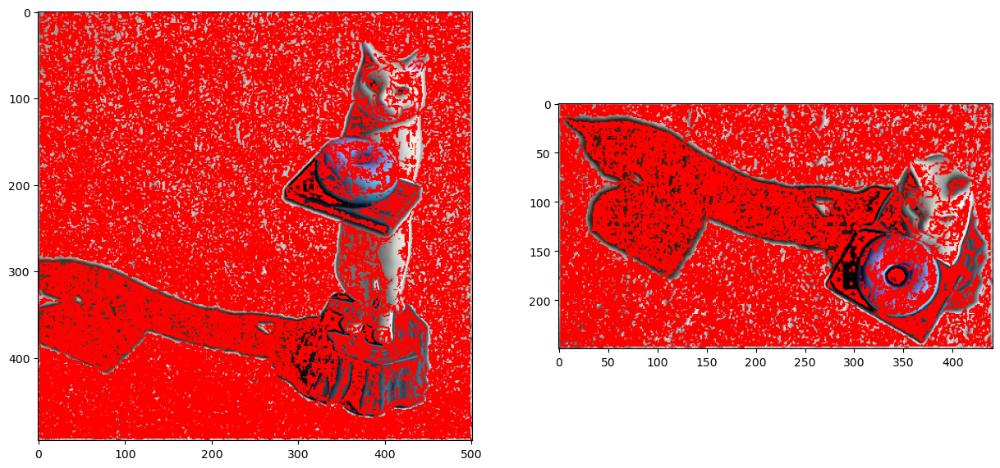

In [81]:
print("Corner detection:")
display_images(img_harris_corner, img_harris_corner_top)

Edges detection:


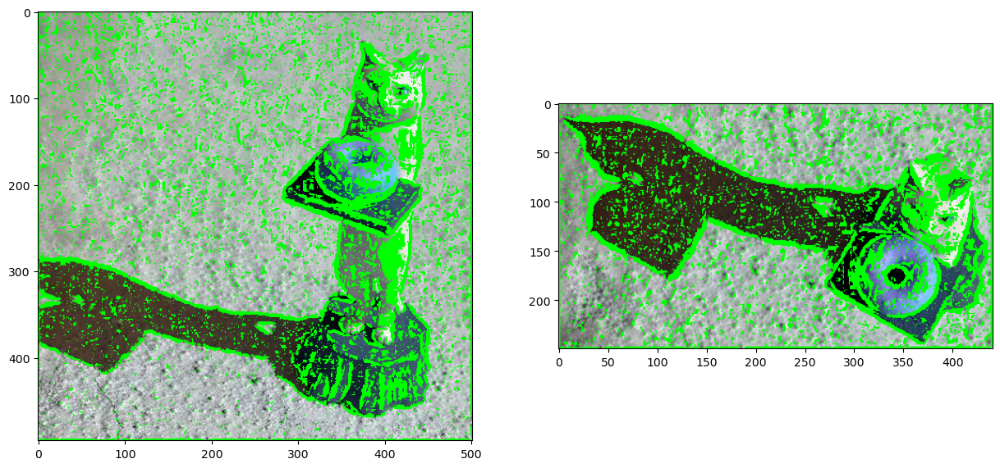

In [82]:
print("Edges detection:")
display_images(img_harris_edges, img_harris_edges_top)

In [83]:
# TODO: Add conclusions

a.2) Figure under artificial light

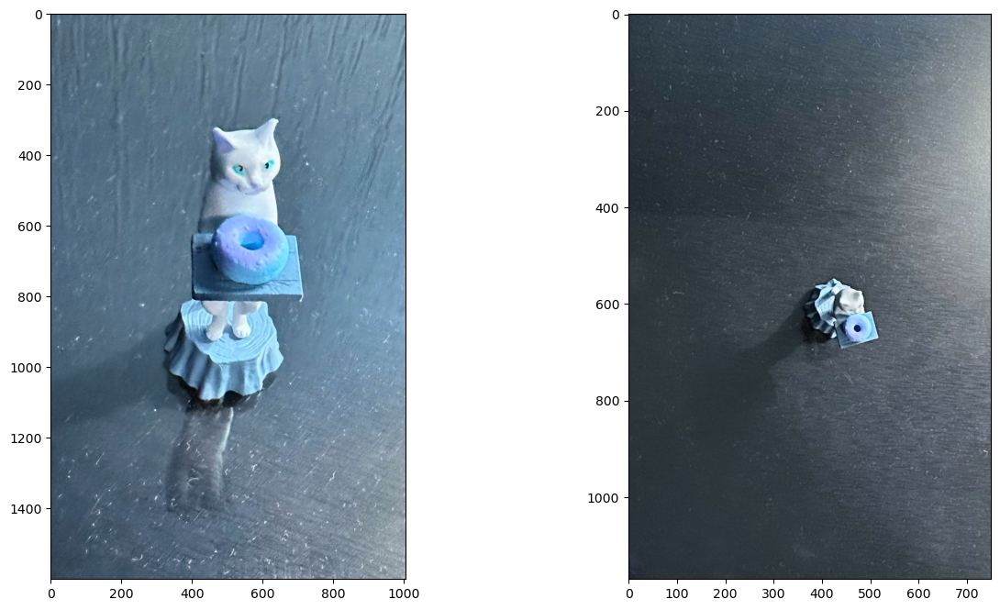

In [84]:
img = cv2.imread(os.path.join(IMAGE_PATH, 'artificial_light.jpeg'))
img_top = cv2.imread(os.path.join(IMAGE_PATH, 'artificial_light_top.jpeg'))

display_images(img, img_top)

In [85]:
img_harris_corner, img_harris_edges = apply_harris_detection(img)
img_harris_corner_top, img_harris_edges_top = apply_harris_detection(img_top)

Corner detection:


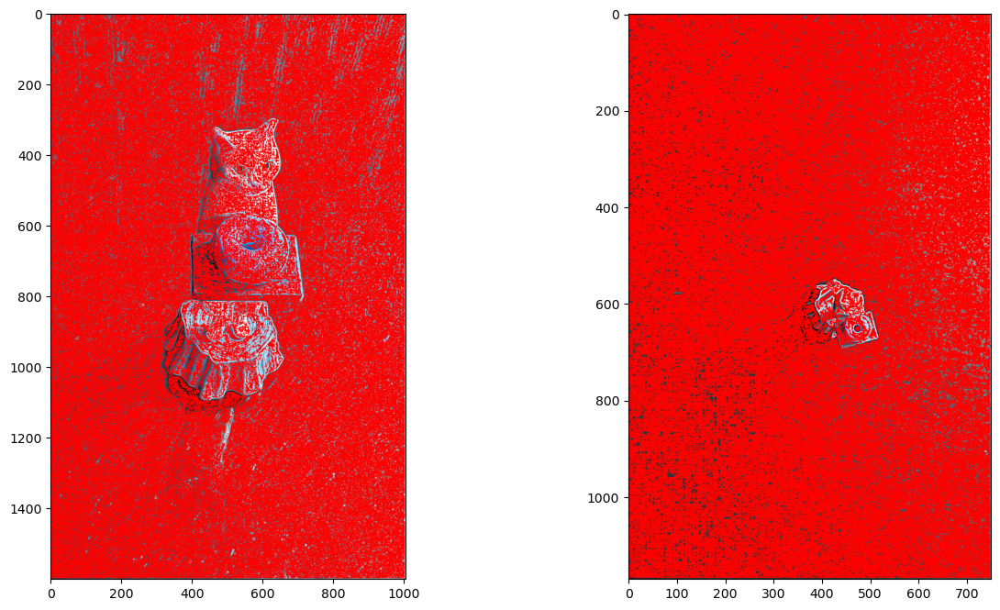

In [86]:
print("Corner detection:")
display_images(img_harris_corner, img_harris_corner_top)

Edges detection:


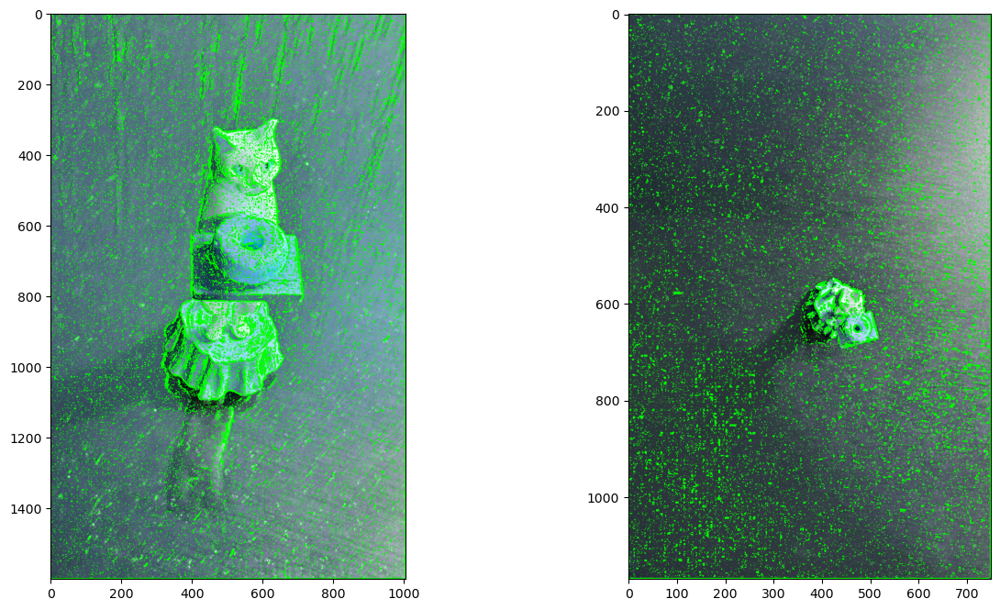

In [87]:
print("Edges detection:")
display_images(img_harris_edges, img_harris_edges_top)

In [88]:
# TODO: Add conclusions

a.3) Figure under low dim light

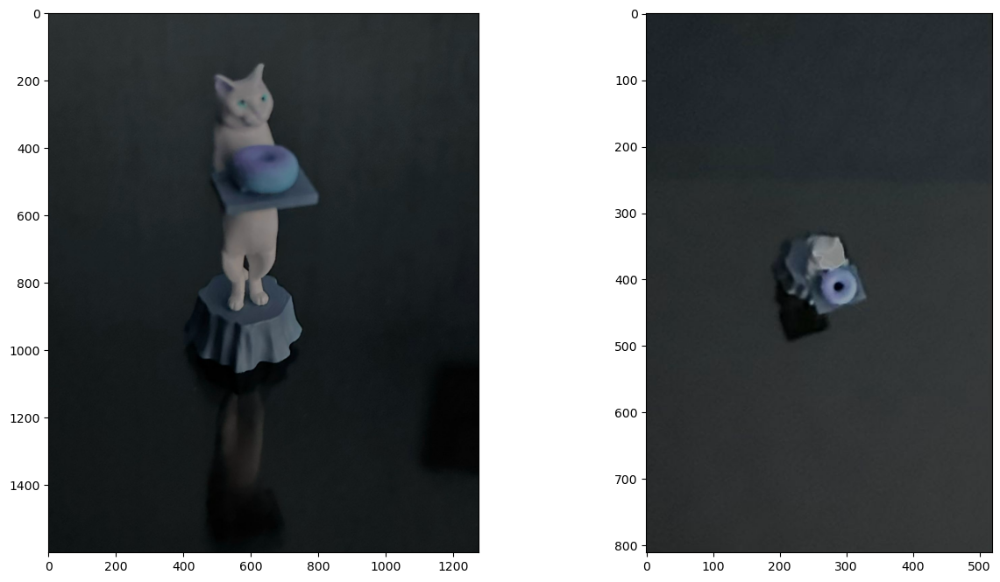

In [89]:
img = cv2.imread(os.path.join(IMAGE_PATH, 'low_light.jpeg'))
img_top = cv2.imread(os.path.join(IMAGE_PATH, 'low_light_top.jpeg'))

display_images(img, img_top)

In [90]:
img_harris_corner, img_harris_edges = apply_harris_detection(img)
img_harris_corner_top, img_harris_edges_top = apply_harris_detection(img_top)

Corner detection:


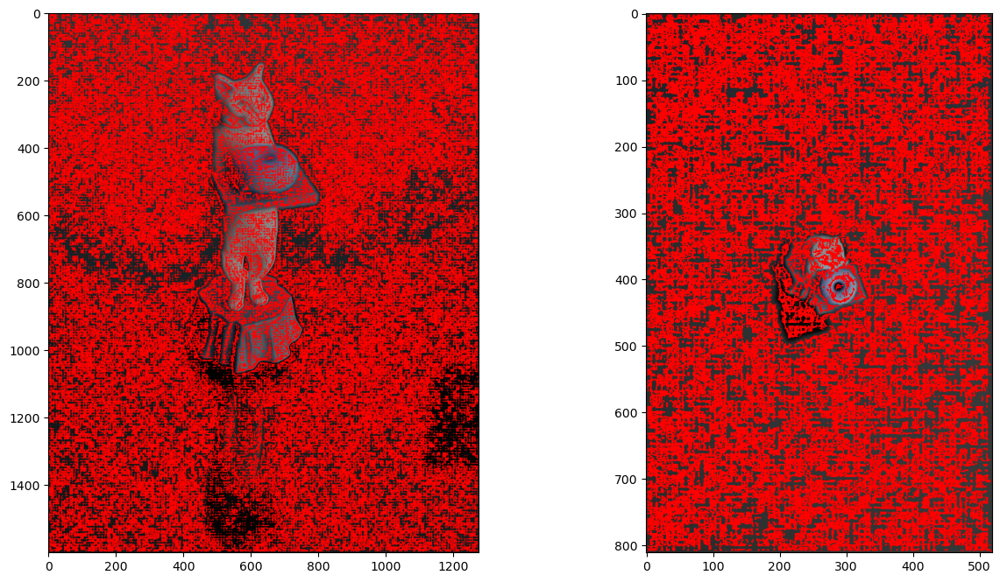

In [91]:
print("Corner detection:")
display_images(img_harris_corner, img_harris_corner_top)

Edges detection:


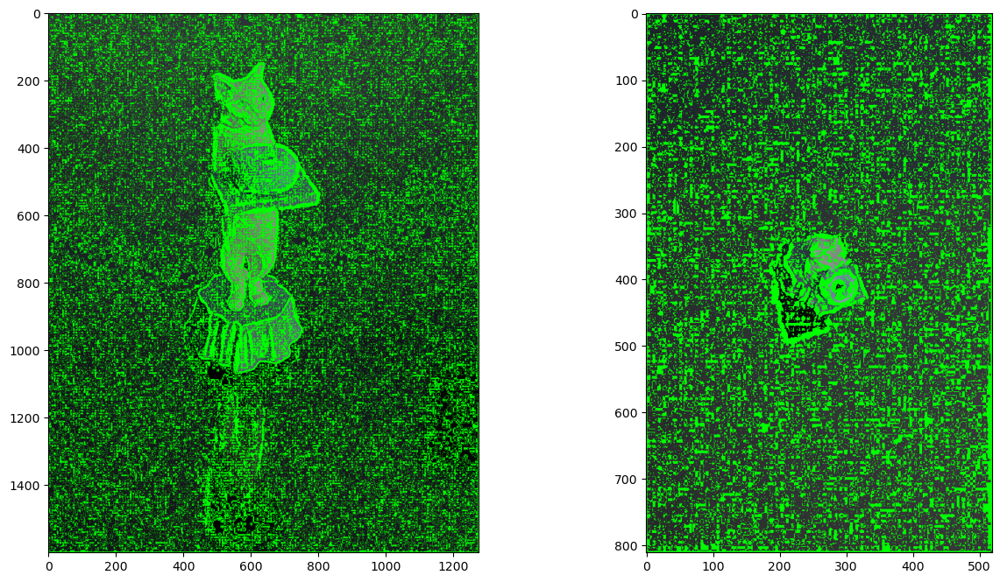

In [92]:
print("Edges detection:")
display_images(img_harris_edges, img_harris_edges_top)

In [93]:
# TODO: Add conclusions